# ***Coronavirus tweets - Text Classification / Sentiment Analysis***

[Kaggle Dataset](https://www.kaggle.com/datasets/datatattle/covid-19-nlp-text-classification/data)

This TP is relatively light coding-wise, please focus on the questions

⚠️Answers mindlessly copied from chatGPT will be penalized⚠️


For those running on a poetry environment, you will probably need to run:

```bash
!poetry add seaborn plotly sklearn xgboost
```

In [1]:
import pandas as pd
import plotly.express as px
import seaborn as sns
import matplotlib.pyplot as plt
import re
import numpy as np

from sklearn.pipeline import Pipeline
from sklearn.feature_extraction.text import TfidfVectorizer, CountVectorizer
from sklearn.model_selection import train_test_split
from sklearn.naive_bayes import MultinomialNB
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import accuracy_score, classification_report, confusion_matrix, f1_score
from nltk.corpus import stopwords
from nltk.tokenize import word_tokenize
from nltk.stem import WordNetLemmatizer
from sklearn.preprocessing import LabelEncoder

from sklearn.ensemble import RandomForestClassifier
from sklearn.svm import LinearSVC
from xgboost import XGBClassifier

## ***Reading Data***

In [2]:
df = pd.read_csv("./data/Corona_NLP.csv", index_col=0)
print(df.shape)
df.head()

(44955, 6)


,UserName,ScreenName,Location,TweetAt,OriginalTweet,Sentiment
0,3799,48751,London,16-03-2020,@MeNyrbie @Phil_Gahan @Chrisitv https://t.co/i...,Neutral
1,3800,48752,UK,16-03-2020,advice Talk to your neighbours family to excha...,Positive
2,3801,48753,Vagabonds,16-03-2020,Coronavirus Australia: Woolworths to give elde...,Positive
3,3802,48754,NaN,16-03-2020,My food stock is not the only one which is emp...,Positive
4,3803,48755,NaN,16-03-2020,"Me, ready to go at supermarket during the #COV...",Extremely Negative


## ***Data Exploration***

In [3]:
class_labels = ["Extremely Negative", "Negative", "Neutral", "Positive", "Extremely Positive"]
category_orders = {"Sentiment": class_labels}

# use the value_counts function on the Sentiment column to print the class distribution # https://pandas.pydata.org/docs/reference/api/pandas.Series.value_counts.html
# use px.histogram to visualize the distribution, you can include the above parameters # https://plotly.com/python/histograms/

Sentiment
Positive              28.0
Negative              24.0
Neutral               19.0
Extremely Positive    16.0
Extremely Negative    14.0
Name: proportion, dtype: float64


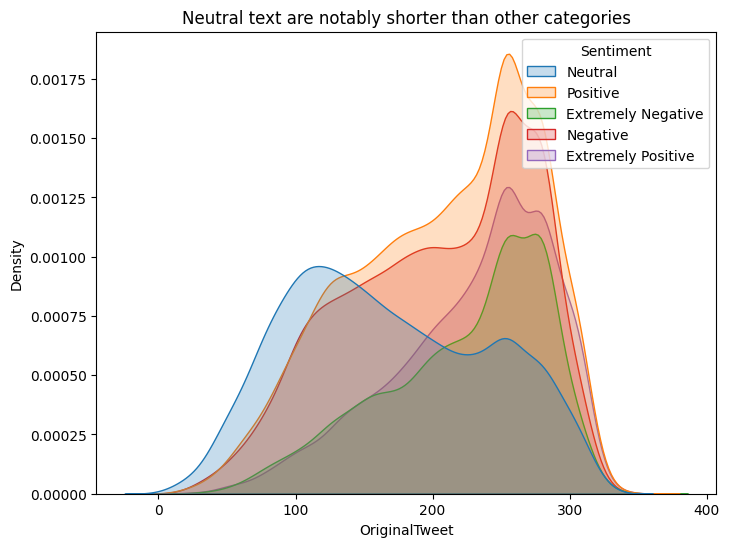

In [4]:
plt.figure(figsize=(8,6))

# use the sns.kdeplot function to visualize text length for each class # https://seaborn.pydata.org/generated/seaborn.kdeplot.html

plt.title("Neutral text are notably shorter than other categories")
plt.show()

What do you observe on this plot ? Could this be important in the future ?
* ***Your** thoughts here*


## ***Preprocessing***

Here's the preprocessing function we'll use today:

* Removing twitter handles and url
* Tokenizing the text
* Lowering and removing non alphanumeric characters
* Removing stopwords
* Lemmatizing

In [5]:
def remove_twitter_handles_url(text):
    twitter_handle_pattern = r'@[\w_]+'
    url_pattern = r'https?://\S+|www\.\S+'
    
    no_handle = re.sub(twitter_handle_pattern, '', text)
    cleaned_text = re.sub(url_pattern, '', no_handle)

    return cleaned_text

def preprocess_text(text):
    lemmatizer = WordNetLemmatizer()
    stop_words = set(stopwords.words('english'))

    cleaned_text = remove_twitter_handles_url(text)
    # Tokenization
    tokens = word_tokenize(cleaned_text)
    # Remove punctuation and convert to lowercase
    words = [word.lower() for word in tokens if word.isalnum()]
    # Remove stopwords
    words = [word for word in words if word not in stop_words]
    # Lemmatization using WordNetLemmatizer
    words = [lemmatizer.lemmatize(word) for word in words]
    
    return ' '.join(words)

## ***Feature extraction***

Let's apply the Bag of Words encoding to some processed text and visualize the output vector

In [6]:
processed = # apply the preprocess function to the first 200 rows of the dataframe 
processed

0                                                       
1      advice talk neighbour family exchange phone nu...
2      coronavirus australia woolworth give elderly d...
3      food stock one empty please panic enough food ...
4      ready go supermarket covid19 outbreak paranoid...
                             ...                        
195    kept hearing boomer gon na travel cheap flight...
196    gt announces 10m loan fund administered provid...
197    pasta pasta sauce pizza sold grocery store eve...
198    panic fear fear mind killer pres working priva...
199    retail store closed end march keep staff custo...
Name: OriginalTweet, Length: 200, dtype: object

In [7]:
bag_of_words =  # instantiate count vectorizer # https://scikit-learn.org/stable/modules/generated/sklearn.feature_extraction.text.CountVectorizer.html
processed_vectors = # fit and transform (at once) the preprocessed text (look through the documentation for the appropriate class method)
processed_vectors

<200x1561 sparse matrix of type '<class 'numpy.int64'>'
	with 3410 stored elements in Compressed Sparse Row format>

What do the dimensions of the Bag of Words vectors correspond to ?
* Dimension 1:
* Dimension 2:

In [8]:
bag_of_words_df = # convert the processed vectors to arrays (look at the "examples" section in the docs) and create a dataframe based on those vectors
bag_of_words_df

,0,1,2,3,4,5,6,7,8,9,...,1551,1552,1553,1554,1555,1556,1557,1558,1559,1560
0,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
1,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
2,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
3,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
4,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
195,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
196,0,0,0,1,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
197,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
198,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0


In [9]:
color_continuous_scale='RdBu_r'

# use the px.imshow plotly function to visualize your dataframe, use the above colorscale 
# https://plotly.com/python/imshow/ 

px.imshow(bag_of_words_df, color_continuous_scale='RdBu_r', title="Representation of [200 x 1561] Bag of Words encodings")

Looking at the vectorized text:
* Is the term "sparse representation" justified ?
    * ***Your** thoughts here*
* Does this look efficient ?
    * ***Your** thoughts here*

In [10]:
tfidf = # repeat with a TDIDF vectorizer 
processed_vectors = #fit and transform, same code as previously
processed_vectors

<200x1561 sparse matrix of type '<class 'numpy.float64'>'
	with 3410 stored elements in Compressed Sparse Row format>

In [11]:
tfidf_df = # create a dataframe of vectors as previously 
tfidf_df

,0,1,2,3,4,5,6,7,8,9,...,1551,1552,1553,1554,1555,1556,1557,1558,1559,1560
0,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
1,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
2,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
3,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
4,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
195,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
196,0.0,0.0,0.0,0.235625,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
197,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
198,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


In [12]:
# use imshow to plot the vector representations

## ***Label encoding and train/test split***

Now that we've vectorized the text, we want to encode the class labels and create a train/test split

In [13]:
label_encoder = # instantiate a label encoder # https://scikit-learn.org/stable/modules/generated/sklearn.preprocessing.LabelEncoder.html
df['Sentiment_enc'] = # fit and transform the encoder on labels

In [14]:
# Split the data into training and testing sets
X = #  
y = #  

test_size=0.2 
random_state=42

# use the train_test_split function with the above test size and random seed
X_train, X_test, y_train, y_test =  # https://scikit-learn.org/stable/modules/generated/sklearn.model_selection.train_test_split.html#sklearn.model_selection.train_test_split

## ***Model Definition***

Now we'll define a pipeline. This pipeline will take raw tweets as input, preprocess and vectorize them, before fitting a classification model to it.
Use the [documentation](https://scikit-learn.org/stable/modules/generated/sklearn.pipeline.Pipeline.html#sklearn.pipeline.Pipeline) to instantiate your pipeline:
* Step 1: [Count vectorizer](https://scikit-learn.org/stable/modules/generated/sklearn.feature_extraction.text.CountVectorizer.html), ***using our preprocessing function as preprocessor***
* Step 2: A classification model, here a [Multinomial Naive Bayes](https://scikit-learn.org/stable/modules/generated/sklearn.naive_bayes.MultinomialNB.html#sklearn.naive_bayes.MultinomialNB)

In [15]:
text_clf = Pipeline([
    
])

## ***Training***

In [16]:
# fit the pipeline to the training data 

Pipeline(steps=[('preprocess',
                 CountVectorizer(preprocessor=<function preprocess_text at 0x000001346D44DCF0>)),
                ('clf', MultinomialNB())])

## ***Prediction***

In [17]:
y_pred = # Use the pipeline to run predictions on the test data

## ***Results visualization***

In [18]:
# styling the confusion matrix
confusion_matrix_kwargs = dict(
    text_auto=True, 
    title="Confusion Matrix", width=1000, height=800,
    labels=dict(x="Predicted", y="True Label"),
    x=class_labels,
    y=class_labels,
    color_continuous_scale='Blues'
)

def report(y_true, y_pred, class_labels):
    print(classification_report(y_true, y_pred, target_names=class_labels))
    # print a classification report of the predictions # https://scikit-learn.org/stable/modules/generated/sklearn.metrics.classification_report.html#sklearn-metrics-classification-report
    # create a confusion matrix and pass it to imshow to visualize it # https://scikit-learn.org/stable/modules/generated/sklearn.metrics.confusion_matrix.html#sklearn.metrics.confusion_matrix
    # (the confusion_matrix_kwargs are here for styling only)
    confusion_matrix = 
    fig = px.imshow(
        confusion_matrix = None, 
        **confusion_matrix_kwargs
        )
    fig.show()

In [19]:
class_labels = label_encoder.inverse_transform(range(5))
# call the report function to visualize the classification results, use the above class_labels

                    precision    recall  f1-score   support

Extremely Negative       0.62      0.39      0.48      1189
Extremely Positive       0.59      0.41      0.48      1457
          Negative       0.43      0.52      0.47      2204
           Neutral       0.68      0.34      0.45      1681
          Positive       0.41      0.62      0.49      2460

          accuracy                           0.48      8991
         macro avg       0.54      0.46      0.48      8991
      weighted avg       0.52      0.48      0.48      8991



## ***What happened here ?***
Looking at the confusion matrix:

* What are some examples of classes that are confused with one another ?
    * ***Your** thoughts here*
* The "Neutral" class has 68% precision and 34% recall, what does this mean ?
    * ***Your** thoughts here*

## ***Let's try with TD-IDF***

But first, let's define a [class](https://www.w3schools.com/python/python_classes.asp) that will make iterating through different architectures and vectorizers a lot faster

In [20]:
class Model:
    def __init__(self, X, y, model_architecture, vectorizer, random_seed=42, test_size=0.2) -> None:
        self.X = X
        self.y = y
        self.model_instance = model_architecture
        self.vectorizer = vectorizer
        self.random_seed = random_seed
        self.test_size = test_size

        self.pipeline = # the pipeline as defined previously

        self.X_train, self.X_test, self.y_train, self.y_test = # train test split using the above X, y, test_size and random_state

    def preprocess(self, text):
        def remove_twitter_handles_url(text):
            twitter_handle_pattern = r'@[\w_]+'
            url_pattern = r'https?://\S+|www\.\S+'
            
            no_handle = re.sub(twitter_handle_pattern, '', text)
            cleaned_text = re.sub(url_pattern, '', no_handle)

            return cleaned_text
        
        lemmatizer = WordNetLemmatizer()
        stop_words = set(stopwords.words('english'))
        cleaned_text = remove_twitter_handles_url(text)
        tokens = word_tokenize(cleaned_text)
        words = [word.lower() for word in tokens if word.isalnum()]
        words = [word for word in words if word not in stop_words]
        words = [lemmatizer.lemmatize(word) for word in words]
        
        return ' '.join(words)
    
    def fit(self):
        # fit self.pipeline to the training data

    def predict(self):
        return self.pipeline.predict(self.X_test)

    
    def predict_proba(self):
        return self.pipeline.predict_proba(self.X_test)

        
    
    def report(self, y_true, y_pred, class_labels):
        # the report function as defined previously

In [21]:
# instantiate the Model class with text and labels (X and y), a multinomial naive bayes model and a tfidf vectorizer
# fit the model
# predict and generate classification report

class_labels=label_encoder.inverse_transform(range(5))

                    precision    recall  f1-score   support

Extremely Negative       0.86      0.04      0.08      1189
Extremely Positive       0.88      0.05      0.09      1457
          Negative       0.40      0.48      0.44      2204
           Neutral       0.80      0.10      0.17      1681
          Positive       0.35      0.86      0.50      2460

          accuracy                           0.39      8991
         macro avg       0.66      0.31      0.26      8991
      weighted avg       0.60      0.39      0.30      8991



* What is the model's behaviour ?
    * ***Your** thoughts here*
* Is this a sign of overfitting, underfitting ?
    * ***Your** thoughts here*
* Why could the model be biased towards the positive and negative classes ?
    * ***Your** thoughts here*
* Naive Bayes assumes that features (words) are conditionally independent given the class label. Between the two encodings we've tried, which one seems to better satisfy this assumption ? 
    * ***Your** thoughts here*

In [22]:
# instantiate the Model class with text and labels (X and y), a logistic regression model and a tfidf vectorizer
# fit the model
# predict and generate classification report


c:\Users\ryanp\AppData\Local\pypoetry\Cache\virtualenvs\nlp-courses-4P5UDvBG-py3.10\lib\site-packages\sklearn\linear_model\_logistic.py:460: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression



                    precision    recall  f1-score   support

Extremely Negative       0.63      0.49      0.55      1189
Extremely Positive       0.68      0.55      0.61      1457
          Negative       0.51      0.52      0.52      2204
           Neutral       0.63      0.67      0.65      1681
          Positive       0.52      0.61      0.56      2460

          accuracy                           0.57      8991
         macro avg       0.59      0.57      0.58      8991
      weighted avg       0.58      0.57      0.57      8991



## ***Results analysis***

Looking at the confusion matrix and the classification report:
* What has improved compared to Naive Bayes ?
    * ***Your** thoughts here*
* Are the confused classes still the same ? Why ?
    * ***Your** thoughts here*
* Are there mistakes that are more understandable/acceptable than others ?
    * ***Your** thoughts here*
* Given the confused classes, what could be done to make the task easier ?
    * ***Your** thoughts here*

## ***Investigate wrong predictions***

Let's take a look at the errors:

In [23]:
test_data = pd.concat((X_test, y_test), axis=1)
test_data["pred"] = y_pred
# using np.where, create a variable equal to one when the encoded sentiment and model prediction match
test_data["correct_prediction"] = # https://numpy.org/doc/stable/reference/generated/numpy.where.html
test_data

,OriginalTweet,Sentiment_enc,pred,correct_prediction
33054,https://t.co/2yMUPatIYU Wear a mask! Especiall...,1,1,1
33564,"In light of Covid-19, Canada's insurers are re...",4,4,1
32707,@ate_ted @SenTedCruz Supply &amp; Demand. COVI...,4,2,0
13252,Around 9 million people die of hunger and hung...,0,0,1
37837,Alarming but informative video everyone should...,1,1,1
...,...,...,...,...
21791,This #Quarantine really has done a number on m...,4,4,1
19570,Panic buying amidst concerns don t mix well wi...,2,4,0
11987,IÂve come in contact with more people while t...,3,3,1
738,Woman of 67 works in a grocery store in the US...,0,2,0


In [24]:
test_data["pred_label"] = test_data.pred.apply(lambda x: label_encoder.inverse_transform([x])[0])
px.histogram(test_data, x="pred_label", 
             color="correct_prediction", 
             category_orders=category_orders, 
             barmode="stack", 
            )

In [25]:
generator = test_data[test_data["correct_prediction"] == 0].head(20).iterrows()

## ***Execute the following cell a bunch of times to assess the quality of the model***

* Do you agree with the model predictions ? Do they make sense ? 
  * Give some examples
  * ***Your** thoughts here*

In [26]:
next_sample = next(generator)[1]

print(f"Tweet: {next_sample['OriginalTweet']}\n")
print(f"Processed Tweet: {preprocess_text(next_sample['OriginalTweet'])}\n")
print(f"True label: {label_encoder.inverse_transform([next_sample['Sentiment_enc']])}")
print(f"Prediction: {label_encoder.inverse_transform([next_sample['pred']])}")

Tweet: @ate_ted @SenTedCruz Supply &amp; Demand. COVID-19 is not going to impact demand indefinitely. Russia/Saudi will cut back production, but worldwide supply will have been decreased significantly. There goes your gas prices plus little things like tires cou

Tweet: supply amp demand going impact demand indefinitely cut back production worldwide supply decreased significantly go gas price plus little thing like tire cou

True label: ['Positive']
Prediction: ['Negative']


## ***Check the probability distribution of predictions***

In this section, we want to take a look at the probabilities given by the model. They can sometimes be useful to improve the quality of the model by getting rid of samples with low certainty (low maximum probability).

*Intuition:* Imagine a text for which the model assigns the following probabilities:
* Extremely Positive: 15%
* Extremely Negative: 4%
* Positive: 31%
* Negative: 29%
* Neutral: 21%

The prediction would be "Positive". However, there are only 3% of difference with "Negative", can you really trust the model prediction in this case ?

In [27]:
probas = pd.DataFrame(lr.predict_proba())
probas.columns = label_encoder.inverse_transform(probas.columns)
probas.head()

,Extremely Negative,Extremely Positive,Negative,Neutral,Positive
0,0.016414,0.575157,0.056214,0.052167,0.300049
1,0.024981,0.117255,0.086403,0.121204,0.650156
2,0.139927,0.039587,0.526478,0.004542,0.289465
3,0.732703,0.002260,0.252289,0.006822,0.005926
4,0.007611,0.775808,0.035592,0.004060,0.176929


In [28]:
probas.describe()

,Extremely Negative,Extremely Positive,Negative,Neutral,Positive
count,8991.000000,8991.000000,8991.000000,8991.000000,8991.000000
mean,0.136675,0.164401,0.241119,0.183092,0.274713
std,0.168845,0.195731,0.152796,0.174858,0.151476
min,0.000008,0.000011,0.000069,0.000015,0.000391
25%,0.032350,0.036027,0.124135,0.044018,0.159858
50%,0.070062,0.081377,0.217835,0.125224,0.258326
75%,0.167299,0.213856,0.335942,0.272104,0.376609
max,0.977328,0.995103,0.843550,0.873715,0.806921


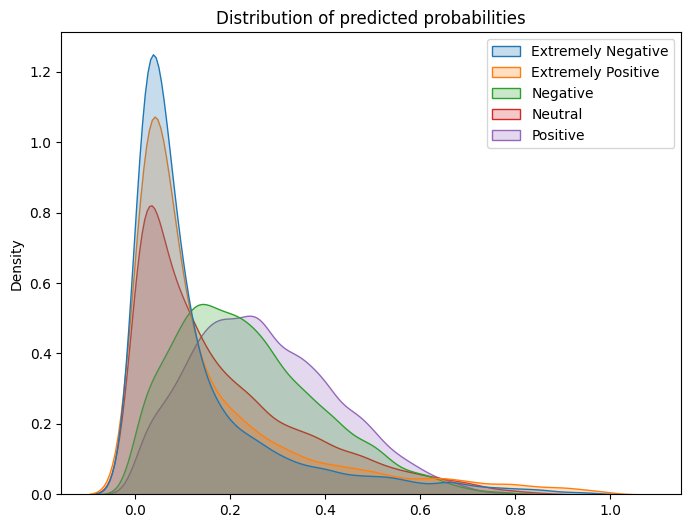

In [29]:
plt.figure(figsize=(8,6))
sns.kdeplot(data=probas, fill=True, )
plt.title("Distribution of predicted probabilities")
plt.show()

## ***Result analysis***

* What can you conclude from the above probability distribution ?
* Does the model appear confident in its predictions ?
* How does it relate to the results obtained with the previous confusion matrices ?
  * ***Your** thoughts here*

## ***Solution 2: Change the class distribution***

In [30]:
{i: label_encoder.inverse_transform([i])[0] for i in range(5)}

{0: 'Extremely Negative',
 1: 'Extremely Positive',
 2: 'Negative',
 3: 'Neutral',
 4: 'Positive'}

In [31]:
new_mapping = {
    0:2, # extremely negative => negative
    1:4 # extremely positive => positive
}

In [32]:
df_reduced_labels = df.copy()
df_reduced_labels["Sentiment_enc"] = # replace the original sentiment encoding using the new mapping 
category_orders = {"Sentiment_enc": ["Negative", "Neutral", "Positive"]}

print(round(df_reduced_labels.Sentiment_enc.value_counts(normalize=True)*100))
fig = px.histogram(df_reduced_labels, x="Sentiment_enc", 
             color="Sentiment_enc", 
             category_orders=category_orders, 
             title="Updated sentiment distribution",
             text_auto=True,
            )

fig.update_layout(
    xaxis = dict(
        tickmode = 'array',
        tickvals = [2,3,4],
        ticktext = ["Negative", "Neutral", "Positive"]
    )
)
fig.show()

Sentiment_enc
4    44.0
2    38.0
3    19.0
Name: proportion, dtype: float64


In [33]:
X_reduced = df_reduced_labels['OriginalTweet']
y_reduced = df_reduced_labels['Sentiment_enc']

In [35]:
# as before, train a logistic regression model with TF-IDF encoding and plot the results

              precision    recall  f1-score   support

    Negative       0.80      0.81      0.80      3393
     Neutral       0.75      0.60      0.67      1681
    Positive       0.81      0.87      0.84      3917

    accuracy                           0.80      8991
   macro avg       0.79      0.76      0.77      8991
weighted avg       0.79      0.80      0.79      8991



## ***Now it's your turn !***

### To achieve the ***"good"*** grade, test at least **two** more models of your choice and answer:
* Comment on the results you obtain, are they similar to the previous ones ? Why ?
    * ***Your** thoughts here*
* Do you think the poor results are a byproduct of the model we choose or the quality of the data ?
    * ***Your** thoughts here*
* If you had to improve those results, what would you do ?
    * ***Your** thoughts here*
  

### To achieve the ***"advanced"*** grade, try to improve or explain the results we obtained by experimenting with different techniques:
* For example, you could try some of those:
  * Balancing classes (oversampling or subsampling)
  * Applying class weights
  * Monitoring training curves
    * Implementing early stopping (models like XGBoost make it easier)
  * Applying normalization
  * Hyperparameter tuning
  * Or anything else you deem coherent